<a href="https://colab.research.google.com/github/jchen42703/MathResearchQHSS/blob/master/Ridge_Regression_for_Prostitution/Prostitution_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

We're analyzing human trafficking records to ascertain the main factors contributing to prostitution via ridge regression. 

# Loading Dependencies

In [1]:
! pip install missingno

In [0]:
import numpy as np
import pandas as pd

In [0]:
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.feature_selection import SelectFromModel

In [4]:
from google.colab import files
files.upload()

Saving global.csv to global.csv


{'global.csv': b'By using this data you agree to the Terms of Use: https://www.ctdatacollaborative.org/terms-use,yearOfRegistration,Datasource,gender,ageBroad,majorityStatus,majorityStatusAtExploit,majorityEntry,citizenship,meansOfControlDebtBondage,meansOfControlTakesEarnings,meansOfControlRestrictsFinancialAccess,meansOfControlThreats,meansOfControlPsychologicalAbuse,meansOfControlPhysicalAbuse,meansOfControlSexualAbuse,meansOfControlFalsePromises,meansOfControlPsychoactiveSubstances,meansOfControlRestrictsMovement,meansOfControlRestrictsMedicalCare,meansOfControlExcessiveWorkingHours,meansOfControlUsesChildren,meansOfControlThreatOfLawEnforcement,meansOfControlWithholdsNecessities,meansOfControlWithholdsDocuments,meansOfControlOther,meansOfControlNotSpecified,meansOfControlConcatenated,isForcedLabour,isSexualExploit,isOtherExploit,isSexAndLabour,isForcedMarriage,isForcedMilitary,isOrganRemoval,typeOfExploitConcatenated,typeOfLabourAgriculture,typeOfLabourAquafarming,typeOfLabourBegg

# Data Preparation and Exploration

In [5]:
globe = pd.read_csv('global.csv', encoding="latin1")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (54) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
globe = globe.T
globe = globe.iloc[3:] #Remove unnecessary portions
globe = globe.T
x = globe.drop(['typeOfSexConcatenated','typeOfSexProstitution'], axis=1) 
x.head()

,gender,ageBroad,majorityStatus,majorityStatusAtExploit,majorityEntry,citizenship,meansOfControlDebtBondage,meansOfControlTakesEarnings,meansOfControlRestrictsFinancialAccess,meansOfControlThreats,meansOfControlPsychologicalAbuse,meansOfControlPhysicalAbuse,meansOfControlSexualAbuse,meansOfControlFalsePromises,meansOfControlPsychoactiveSubstances,meansOfControlRestrictsMovement,meansOfControlRestrictsMedicalCare,meansOfControlExcessiveWorkingHours,meansOfControlUsesChildren,meansOfControlThreatOfLawEnforcement,meansOfControlWithholdsNecessities,meansOfControlWithholdsDocuments,meansOfControlOther,meansOfControlNotSpecified,meansOfControlConcatenated,isForcedLabour,isSexualExploit,isOtherExploit,isSexAndLabour,isForcedMarriage,isForcedMilitary,isOrganRemoval,typeOfExploitConcatenated,typeOfLabourAgriculture,typeOfLabourAquafarming,typeOfLabourBegging,typeOfLabourConstruction,typeOfLabourDomesticWork,typeOfLabourHospitality,typeOfLabourIllicitActivities,typeOfLabourManufacturing,typeOfLabourMiningOrDrilling,typeOfLabourPeddling,typeOfLabourTransportation,typeOfLabourOther,typeOfLabourNotSpecified,typeOfLabourConcatenated,typeOfSexPornography,typeOfSexRemoteInteractiveServices,typeOfSexPrivateSexualServices,isAbduction,RecruiterRelationship,CountryOfExploitation,recruiterRelationIntimatePartner,recruiterRelationFriend,recruiterRelationFamily,recruiterRelationOther,recruiterRelationUnknown
0,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,Unknown,-99,0,0,0,0,1
1,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,Unknown,-99,0,0,0,0,1
2,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,Unknown,-99,0,0,0,0,1
3,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,Unknown,-99,0,0,0,0,1
4,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,-99,Unknown,-99,0,0,0,0,1


In [0]:
def get_unique(df):
  '''
  Understanding the unique classes and class frequencies of the dataset
  
  param df: dataframe
  
  Returns: 
    a dictionary of all of the columns' unique values
  '''
  # fetch a list of all of the column names
  col_list = list(df)
  unique_dict = {}
  # append unique values and their frequencies
  for i in range(len(col_list)):
    unique = np.unique(df[col_list[i]], return_counts = True)
    unique_dict[col_list[i]] = unique
  return unique_dict

In [8]:
unique_x = get_unique(x)
unique_x

{'CountryOfExploitation': (array(['-99', 'AE', 'AF', 'AL', 'AR', 'AT', 'BA', 'BG', 'BH', 'BY', 'CN',
         'CY', 'CZ', 'DK', 'EC', 'EG', 'GH', 'HK', 'HT', 'ID', 'IT', 'JO',
         'JP', 'KH', 'KW', 'KZ', 'LB', 'MD', 'MG', 'MK', 'MU', 'MX', 'MY',
         'OM', 'PH', 'PL', 'QA', 'RO', 'RU', 'SA', 'SG', 'SL', 'SN', 'SY',
         'TH', 'TJ', 'TM', 'TR', 'TT', 'TW', 'UA', 'UG', 'US', 'UZ', 'VN',
         'Y1', 'ZA', 'ZZ'], dtype=object),
  array([11738,   515,    84,    45,    36,    24,   127,   356,    22,
           381,    79,    12,    54,    17,    54,    13,   545,    31,
           339,  1776,    28,   108,   123,   983,   210,   222,    78,
          5698,    94,   194,    20,    13,   907,    94,  1988,   352,
           239,   273,  2787,   257,    37,    81,   370,    41,   453,
            88,    26,   262,    96,    33,  5308,   123, 16956,   193,
            16,   211,    36,   188])),
 'RecruiterRelationship': (array(['-99', 'Family/Relative', 'Family/Relative;Other',

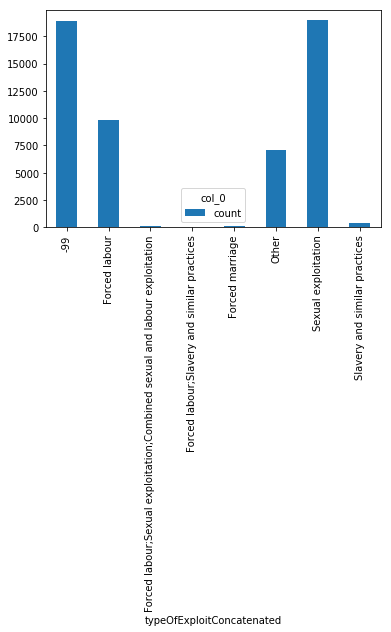

In [9]:
# visualize the frequencies of the types of exploits
my_tab = pd.crosstab(index = x["typeOfExploitConcatenated"],  # Make a crosstab
                              columns="count")      # Name the count column

my_tab.plot.bar()

In [10]:
# Remove columns with only NaNs and 0s 
cols_useless = ["isForcedMilitary", "isOrganRemoval", "typeOfLabourTransportation", "typeOfSexRemoteInteractiveServices", "typeOfLabourTransportation", "typeOfLabourMiningOrDrilling"]
x_ = x.drop(cols_useless, axis = 1)
# See all the unique features
unique_x_ = get_unique(x_)
unique_x_

{'CountryOfExploitation': (array(['-99', 'AE', 'AF', 'AL', 'AR', 'AT', 'BA', 'BG', 'BH', 'BY', 'CN',
         'CY', 'CZ', 'DK', 'EC', 'EG', 'GH', 'HK', 'HT', 'ID', 'IT', 'JO',
         'JP', 'KH', 'KW', 'KZ', 'LB', 'MD', 'MG', 'MK', 'MU', 'MX', 'MY',
         'OM', 'PH', 'PL', 'QA', 'RO', 'RU', 'SA', 'SG', 'SL', 'SN', 'SY',
         'TH', 'TJ', 'TM', 'TR', 'TT', 'TW', 'UA', 'UG', 'US', 'UZ', 'VN',
         'Y1', 'ZA', 'ZZ'], dtype=object),
  array([11738,   515,    84,    45,    36,    24,   127,   356,    22,
           381,    79,    12,    54,    17,    54,    13,   545,    31,
           339,  1776,    28,   108,   123,   983,   210,   222,    78,
          5698,    94,   194,    20,    13,   907,    94,  1988,   352,
           239,   273,  2787,   257,    37,    81,   370,    41,   453,
            88,    26,   262,    96,    33,  5308,   123, 16956,   193,
            16,   211,    36,   188])),
 'RecruiterRelationship': (array(['-99', 'Family/Relative', 'Family/Relative;Other',

In [11]:
# Execute one hot encoding
from sklearn import preprocessing 
x_encoded = x_.apply(preprocessing.LabelEncoder().fit_transform)
unique_x_encoded = get_unique(x_encoded)
unique_x_encoded

{'CountryOfExploitation': (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
         34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
         51, 52, 53, 54, 55, 56, 57]),
  array([11738,   515,    84,    45,    36,    24,   127,   356,    22,
           381,    79,    12,    54,    17,    54,    13,   545,    31,
           339,  1776,    28,   108,   123,   983,   210,   222,    78,
          5698,    94,   194,    20,    13,   907,    94,  1988,   352,
           239,   273,  2787,   257,    37,    81,   370,    41,   453,
            88,    26,   262,    96,    33,  5308,   123, 16956,   193,
            16,   211,    36,   188])),
 'RecruiterRelationship': (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17]),
  array([  451,  1589,    17,    10,  1465,    20,     2,    47,     3,
          1575,    36,    25,     3,    30, 

# Applying the Ridge Regression 

A ridge regression assigns coefficients to each parameter and optimizes the entire mathematical equation to make irrelevant coefficients and parameters zero. In other words, it's as if you've placed a cowboy at the origin that lassos away data points that are too close. A ridge regression is resistant against multicollinearity within the dataset. 

In [18]:
clf = RidgeCV(cv=2)
sfm = SelectFromModel(clf, threshold=0.000025) #Instantiate estimator 
y = globe.typeOfSexProstitution
print(sfm.fit(x_encoded, y))

SelectFromModel(estimator=RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=2,
                                  fit_intercept=True, gcv_mode=None,
                                  normalize=False, scoring=None,
                                  store_cv_values=False),
                max_features=None, norm_order=1, prefit=False,
                threshold=2.5e-05)


In [19]:
n_features = sfm.transform(x_encoded).shape[1]
while n_features > 8:
    #sfm.threshold += 0.00001
    sfm.threshold += 0.1
    X_transform = sfm.transform(x_encoded)
    n_features = X_transform.shape[1]
    print(n_features) #Decrease number of features/parameters via Ridge 
print(X_transform) 

52
47
47
47
47
43
42
41
41
39
39
39
37
37
36
35
33
33
33
33
33
33
32
32
31
29
29
27
26
26
26
26
26
25
24
24
24
24
23
23
22
21
21
21
21
21
21
21
20
20
20
20
20
20
20
20
20
19
18
18
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
16
15
15
15
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
12
12
12
12
12
12
11
11
11
11
11
11
11
11
11
11
11
11
11
11
11
11
11
10
10
10
10
10
10
10
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
8
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [1 0 0 ... 1 0 1]
 [1 0 0 ... 1 0 1]
 [1 0 0 ... 1 0 1]]


In [20]:
x = sfm.get_support() #See mask of selected features
print(x)

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False  True False False False False False False
  True  True False  True False  True False  True  True  True False False
 False False False False False]


In [21]:
for i in range(len(x)):
    print(i)
    print(x[i]) #Display selection status for each feature  

0
False
1
False
2
False
3
False
4
False
5
False
6
False
7
False
8
False
9
False
10
False
11
False
12
False
13
False
14
False
15
False
16
False
17
False
18
False
19
False
20
False
21
False
22
False
23
False
24
False
25
False
26
False
27
False
28
False
29
True
30
False
31
False
32
False
33
False
34
False
35
False
36
True
37
True
38
False
39
True
40
False
41
True
42
False
43
True
44
True
45
True
46
False
47
False
48
False
49
False
50
False
51
False
52
False


In [22]:
x_encoded.iloc[0:3,0:48] #Change the last number to the numbers that were assigned true in the code above; the very last column is the name of the true factor 
# For example, if the above cells says 48 is true, then change that very last number to 48. Then look at the very last column of the display. That's one of the factors with a strong relationship to prostitution. 

,gender,ageBroad,majorityStatus,majorityStatusAtExploit,majorityEntry,citizenship,meansOfControlDebtBondage,meansOfControlTakesEarnings,meansOfControlRestrictsFinancialAccess,meansOfControlThreats,meansOfControlPsychologicalAbuse,meansOfControlPhysicalAbuse,meansOfControlSexualAbuse,meansOfControlFalsePromises,meansOfControlPsychoactiveSubstances,meansOfControlRestrictsMovement,meansOfControlRestrictsMedicalCare,meansOfControlExcessiveWorkingHours,meansOfControlUsesChildren,meansOfControlThreatOfLawEnforcement,meansOfControlWithholdsNecessities,meansOfControlWithholdsDocuments,meansOfControlOther,meansOfControlNotSpecified,meansOfControlConcatenated,isForcedLabour,isSexualExploit,isOtherExploit,isSexAndLabour,isForcedMarriage,typeOfExploitConcatenated,typeOfLabourAgriculture,typeOfLabourAquafarming,typeOfLabourBegging,typeOfLabourConstruction,typeOfLabourDomesticWork,typeOfLabourHospitality,typeOfLabourIllicitActivities,typeOfLabourManufacturing,typeOfLabourPeddling,typeOfLabourOther,typeOfLabourNotSpecified,typeOfLabourConcatenated,typeOfSexPornography,typeOfSexPrivateSexualServices,isAbduction,RecruiterRelationship,CountryOfExploitation
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0


In [0]:
# Create a list of all the selected factors 
true_cols = [list(x_encoded)[i] for i in [29, 36, 37, 39, 41, 43, 44, 45]]

In [24]:
# Print all of the selected factors; These are the contributors to prostitution 
true_cols

['isForcedMarriage',
 'typeOfLabourHospitality',
 'typeOfLabourIllicitActivities',
 'typeOfLabourPeddling',
 'typeOfLabourNotSpecified',
 'typeOfSexPornography',
 'typeOfSexPrivateSexualServices',
 'isAbduction']